This colab notebook was the main place for training our model on the moon dataset. 

We had a hard time generating the training data for our lunar model so the notebook is split into 2 parts. 


In the first part, we are training our model on the data given to us by Gareth. and the second part is with our own data.


# Important: 

As we were not able to produce a good enough size distribution plot to compare our distributions with gruond truth, we will be using the following metrics for our evaluation: 

- Precision is the number of true positive detections (correctly detected craters) divided by the sum of true positive and false positive detections (all detections that were claimed as craters). It measures the accuracy of positive detections.

- Recall: Recall is the number of true positive detections divided by the sum of true positive and false negative detections (craters that were not detected). It measures the completeness of the detections.

- mAP50: mAP50 (mean Average Precision at IoU threshold of 0.5) is the average precision score over all craters, computed at an Intersection over Union (IoU) threshold of 0.5. It measures the performance of the object detector in terms of precision and recall.

- F1 Score: The F1 score is the harmonic mean of precision and recall. It is a single score that balances the trade-off between precision and recall and is commonly used as a single performance metric for binary classification problems.


# Difference Between Mars training and Moon: 
- Much larger dataset - In this case our train/val/test split makes more sense, as we have a 0.8/0.1/0.1 split. 

- The data for mars was very similar, with no parts darker than the other.
- Another difference between the 2 is that there are no sedimentary rocks or lava flows and big differences in surface areas on the moon. 

  - This is one of the main reasons why we decieded to train 2 different models

# Basic Imports and Setups: 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

%cd drive/MyDrive/yolov5

%pip install -qr requirements.txt  # install

import torch
import utils
display = utils.notebook_init()  # checks

YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CPU


Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.6/225.8 GB disk)


Setup tensorboard: 

In [2]:
# Setup TensorBoard: 
def tensorboard_check():
  %load_ext tensorboard
  %tensorboard --logdir runs/train

tensorboard_check()

<IPython.core.display.Javascript object>

# Using Given data: 

## Preprocessing using our in-built functions: 

In [3]:
import sys
sys.path.insert(0, '/content/drive/My Drive/Colab Notebooks')
from data_processor import DataProcessor



# Instanciate the class and tell it where the images and labels are
lunar_labels_path = '/content/drive/MyDrive/yolov5/datasets/Lunar_dataset_train/labels'
lunar_img_path = '/content/drive/MyDrive/yolov5/datasets/Lunar_dataset_train/images'

moonDataProcessor = DataProcessor(lunar_img_path, lunar_labels_path)


# Making the directories
moon_data_folder = "/content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/"
moonDataProcessor.create_data_directories(moon_data_folder)
moonDataProcessor.split_and_move_data(moon_data_folder)

moving files into /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/images/train
moving files into /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/images/val
moving files into /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/images/test
moving files into /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/labels/train
moving files into /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/labels/val
moving files into /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/labels/test


##  Getting First baseline model: 

- After preprocessing the data and splitting it (0.8 for train, 0.1 val and 0.1 test), we will be using the low hyperparameters (with 0.2 IoU instead of 0.5). We will also be using a smaller batchsize of 128. This is because we have so many images we would not be able to load them all onto memory as in the mars data.

- We know that using an IoU of 0.2 was not good and we changed it for the next models - They produced more accurate resuts, as the model learned to place bounding boxes in more precise locations with an IoU of 050 and not 0.20 (In the later models).


### Testing the small model: Using batch size of 128 as we have way more images than for mars

In [4]:
!python train.py --img 416 --cfg yolov5s.yaml --hyp hyps/hyp.scratch-low.yaml --batch 128 --epochs 100 --data moon_gareth_data.yaml --weights yolov5s.pt --name running_lunar_model_baseline_small --single-cls 

train: weights=yolov5s.pt, cfg=yolov5s.yaml, data=moon_gareth_data.yaml, hyp=hyps/hyp.scratch-low.yaml, epochs=100, batch_size=128, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_lunar_model_baseline_small, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, an

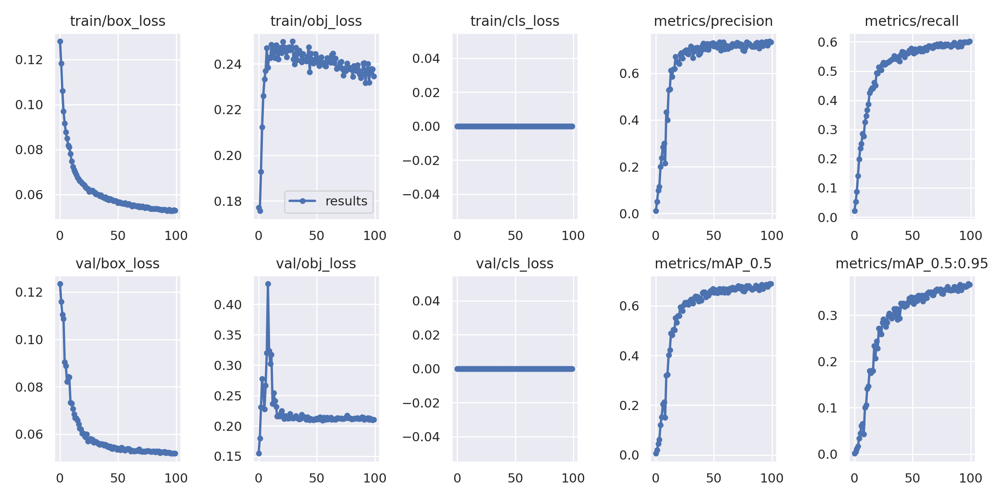

In [10]:
# Visualise the training Curves: 
from IPython.display import Image
Image(filename='/content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_small2/results.png')

From the above plots, we can see that the box loss for both the train and validation sets are converging nicely, however the object loss (which decides if we have a crater or not in our bounding boxes) is increasing with more epochs.

Let's validate our data with the test set: 

In [7]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_small2/weights/best.pt --data moon_gareth_data.yaml --img 416 --task test --name Lunar_validation_small_model_gareth_data

val: data=/content/drive/MyDrive/yolov5/data/moon_gareth_data.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_small2/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_validation_small_model_gareth_data, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/labels/test... 205 images, 0 backgrounds, 0 corrupt: 100% 205/205 [00:07<00:00, 27.87it/s]
test: New cache created: /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/labels/test.cache
                 Class     Imag

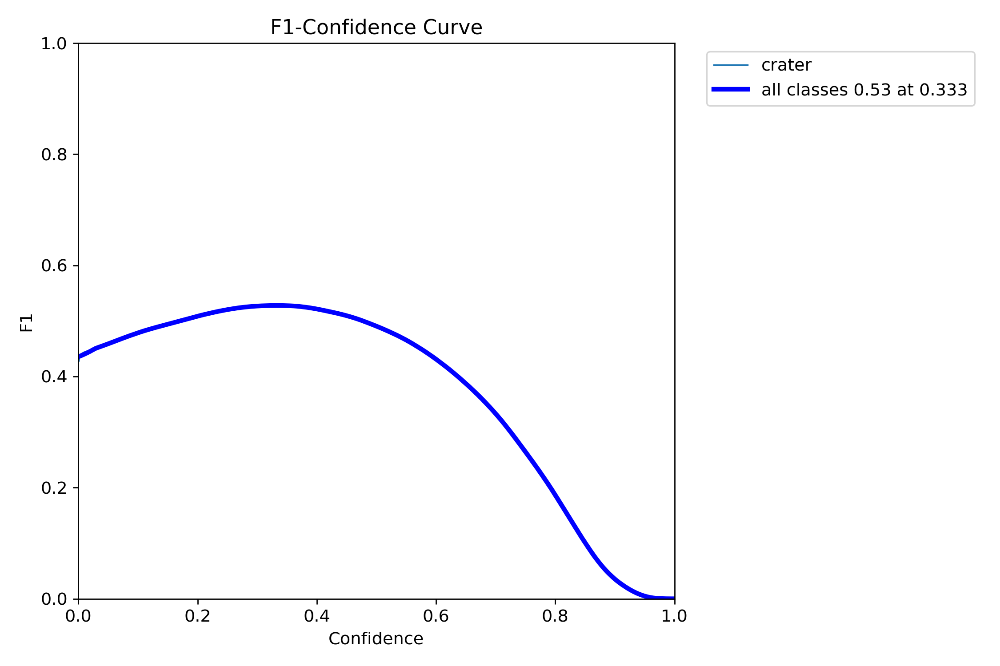

In [3]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_validation_small_model_gareth_data3/F1_curve.png')

Our F1 curve is quite average, with a threshold value of 33%. This is quite average and will be used as our baseline for our next models. 


We can try visualising some samples but I think They will be quite hard to visualise: 

## Let's Visualise some of the images:
Using detect Function: 

From the F1 curve, we can see that best confidence would be 0.33.

In [14]:
!python detect.py --weights /content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_small2/weights/best.pt --img 416 --conf 0.33 --source /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/images/test/

detect: weights=['/content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_small2/weights/best.pt'], source=/content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/images/test/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.33, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/205 /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/images/test/-184_-30_png.rf.16822a209e4e0886c472108060fab700.jpg: 416x416 282 craters, 9.9ms
image 2/205 /content/drive/MyDrive/yolov5/

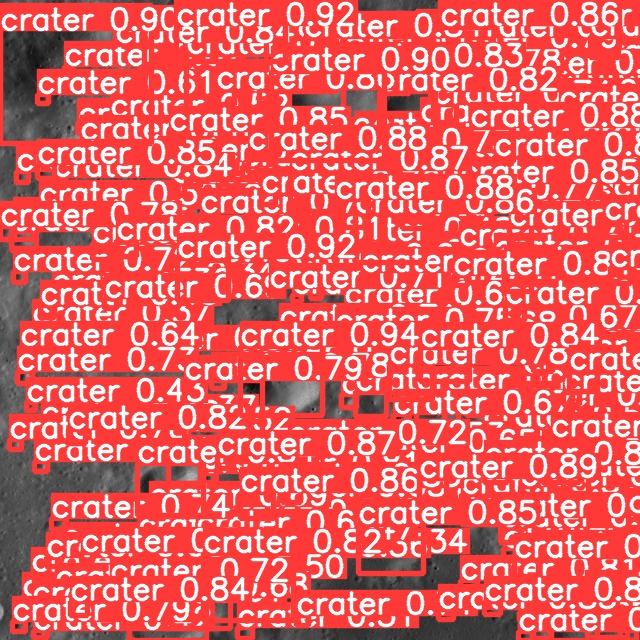

In [15]:
Image(filename='/content/drive/MyDrive/yolov5/runs/detect/exp17/-184_-30_png.rf.16822a209e4e0886c472108060fab700.jpg')

As predicted, it is quite hard to see and having a size distribution plot would really faciliate our analysis. For now we will be sticking to maximising the precision/recall and the mAP50. 

### Testing Small sized Model with IoU threshold of 0.50: BUT IMAGE SIZE OF 416 which is smaller than the size of the images which are

In [4]:
!python train.py --img 416 --cfg yolov5s.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch 128 --epochs 50 --data moon_gareth_data.yaml --weights yolov5s.pt --name running_lunar_model_baseline_small_IoU50 --single-cls 

train: weights=yolov5s.pt, cfg=yolov5s.yaml, data=moon_gareth_data.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=50, batch_size=128, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_lunar_model_baseline_small_IoU50, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.

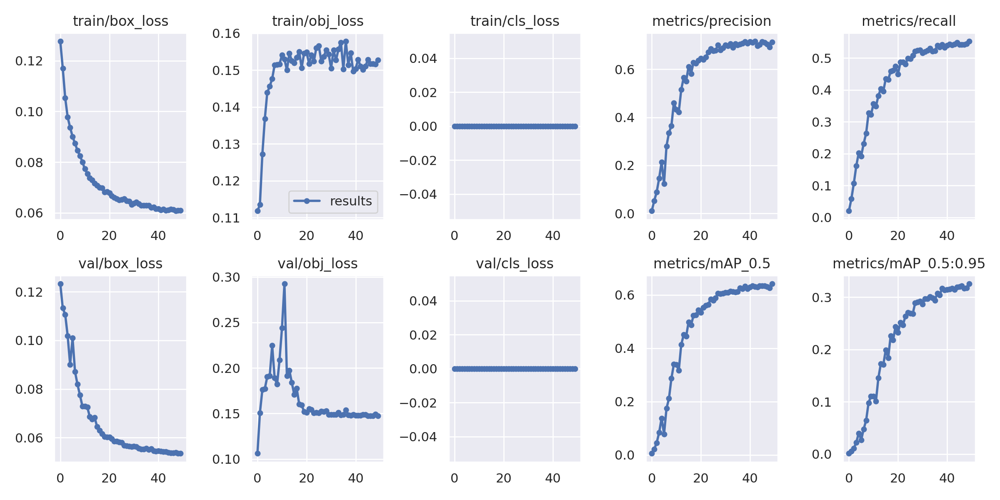

In [4]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_small_IoU502/results.png')

We can see that the box loss for the train and val are converging nicely, however the objext loss is still behaving eratically. I am not sure why, but I suppose it is because there are so many false positive (craters that are model detected but are not in the training data). We will be ignoring this for now, eventhough we should look into this more.

In [5]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_small_IoU502/weights/best.pt --data moon_gareth_data.yaml --img 416 --task test --name Lunar_validation_small_model_gareth_data_05_IoU

val: data=/content/drive/MyDrive/yolov5/data/moon_gareth_data.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_small_IoU502/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_validation_small_model_gareth_data_05_IoU, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/labels/test.cache... 205 images, 0 backgrounds, 0 corrupt: 100% 205/205 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/7 [00:00<?, ?it/s]tensor([0.917

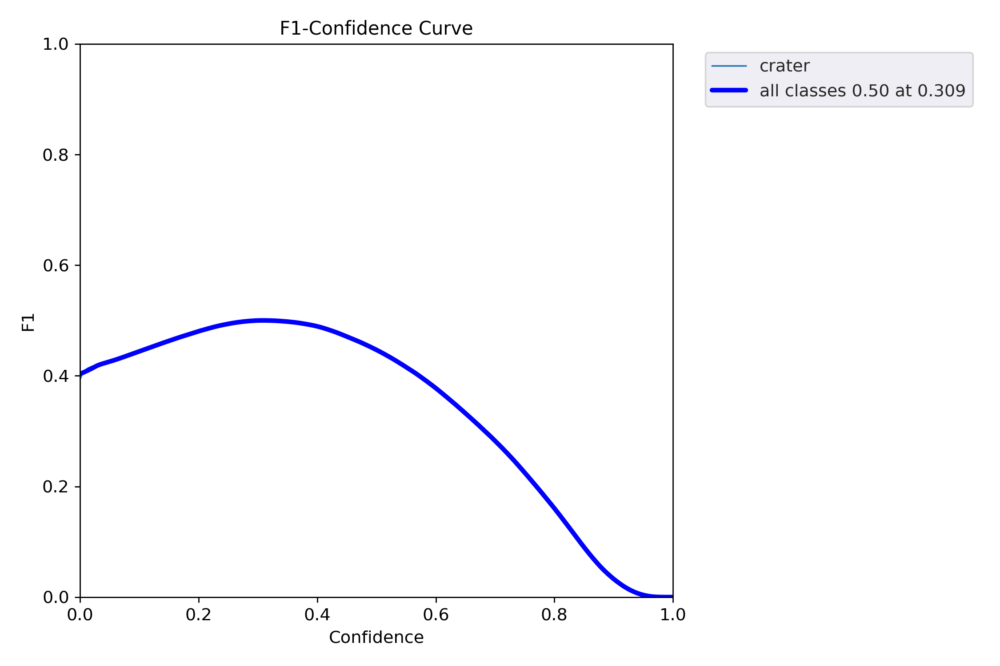

In [5]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_validation_small_model_gareth_data_05_IoU/F1_curve.png')

We can see that the F1 curves are very similar between the 0.2 IoU training and the 0.5 IoU. However we know that using the IoU 0.5 for training has made for better results as our metrics (precision and recall) are lower for 0.5 IoU, as the model is performing better and detecting more false positives comapred to the 0.2 IoU trained Model.

### Now we train the same model with IoU 0.50 and and with a larger image size (same as original) of 640x640. 

In [6]:
!python train.py --img 640 --cfg yolov5m.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch 128 --epochs 50 --data moon_gareth_data.yaml --weights yolov5m.pt --name running_lunar_model_baseline_medium_IoU50_Good --single-cls 

train: weights=yolov5m.pt, cfg=yolov5m.yaml, data=moon_gareth_data.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=50, batch_size=128, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=running_lunar_model_baseline_medium_IoU50_Good, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, 

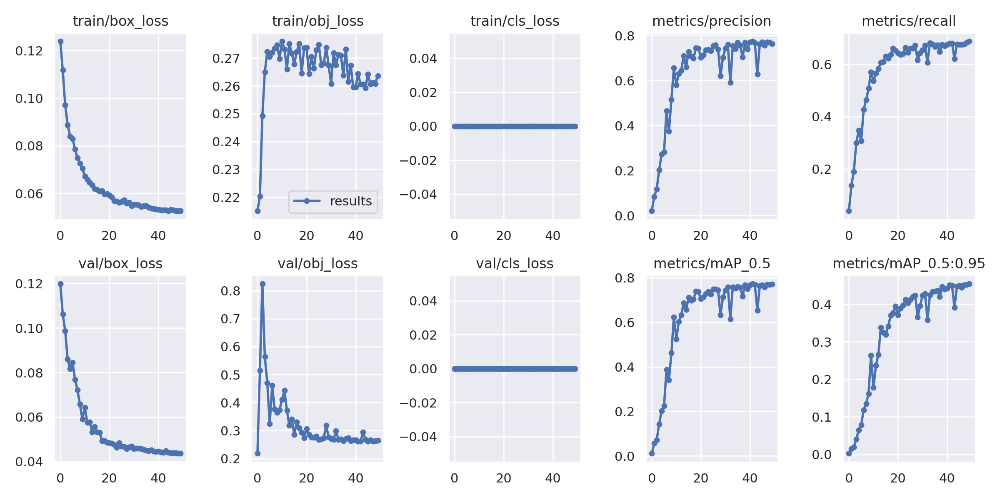

In [6]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_medium_IoU50_Good3/results.png')

From these training curves, we can see that the boxloss train and validate curves are converging nicely, and there is no obvious overfitting (Validation loss is staying low).

However, the object loss is still going crazy for the train set, but it is converging well for the validation set, but at a high number of around 0.3.

We would've tried to change this if we had more time. 

Now let's test it on the test set: 

In [7]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_medium_IoU50_Good3/weights/best.pt --data moon_gareth_data.yaml --img 640  --task test --name Lunar_validation_Medium_model_gareth_data_05_IoU

val: data=/content/drive/MyDrive/yolov5/data/moon_gareth_data.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/running_lunar_model_baseline_medium_IoU50_Good3/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_validation_Medium_model_gareth_data_05_IoU, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/moon_from_gareth_splitted/labels/test.cache... 205 images, 0 backgrounds, 0 corrupt: 100% 205/205 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/7 [00:00<?, ?it/s]tenso

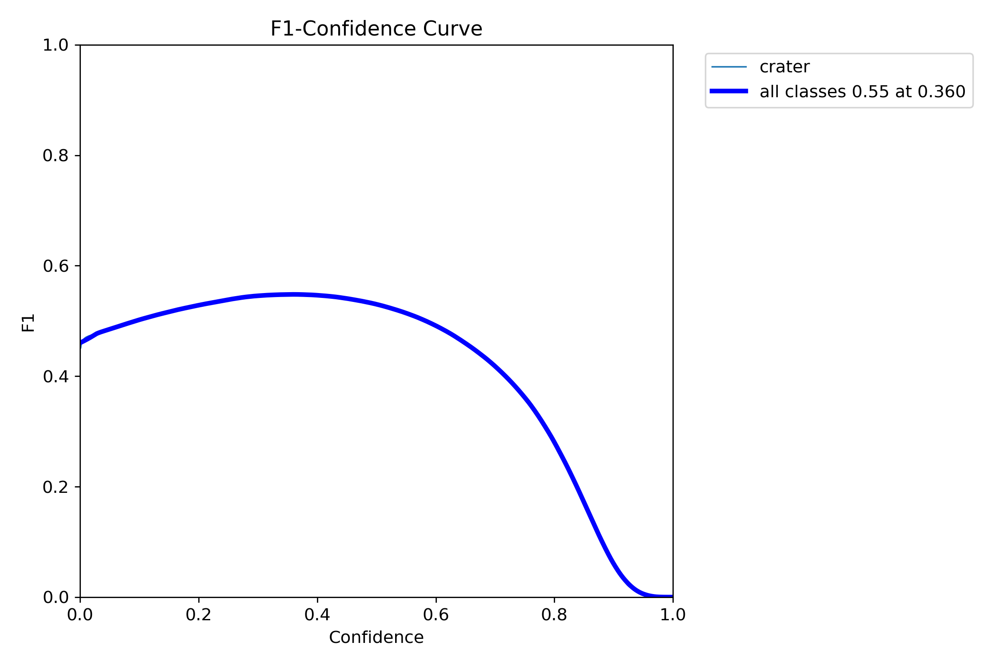

In [7]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_validation_Medium_model_gareth_data_05_IoU/F1_curve.png')

From the F1 curve, we can see that our model is working a little better, as our threshold has increased to 36%. However the maximum value is still quite low. This is because our precision and recall are both still quite average at 73% and 44% and our mAP50 is at around 55%. This suggests that our model is very average as mAP50 is close to 0.5. We do not have a good balance between precision and reacall, making our F1 curve look quite distorted too.

We trained the right sized images with a medium sized model which was pretrained, it showed better results than the small model, but this could either be due to the model size, or the image size.

We should have done more analysis on this. But for now, the medium model is better for Gareth's dataset.

So the medium Model is performing the best when using this model.

# Full Model: 

- When we were able to get our own lunar training data ready, we ran out of time to download all the data and place into one single folder to just train one model on all the data. 

Instead we decided to split the training data into 2 sides. The left (A, B) and the right (C, D) training data. We decided on this split as we noticed that the images on the right side were much darker than on the left. 

- This led me to beleiving that that possibly making an ensemble model where one model was trained on the left side and another on the right could lead to increased variance in our results. Meaning our ensemble model could detect craters in both dark areas and light ones. 

- As we do not know what the test data will look like on Friday, I thought Our model could perform well like this. 


Therefore the steps were the following: 

- Preprocess the data: 
  - Split the left side (A, B) into train/val/test split
  - Train a medium model on it (Faster than the large but still close in metrics)
  - Validate on data from the left side, as well as data on the right side. 

Do the same for the right side. 



Start By training the one model on Left Side: with medium as it performed better with Gareth's dataset:

In [8]:
!python train.py --img 416 --cfg yolov5m.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch 128 --epochs 50 --data moon_left.yaml --weights yolov5m.pt --name Lunar_Model_our_data_Left_side --single-cls 

train: weights=yolov5m.pt, cfg=yolov5m.yaml, data=moon_left.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=50, batch_size=128, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=Lunar_Model_our_data_Left_side, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, io

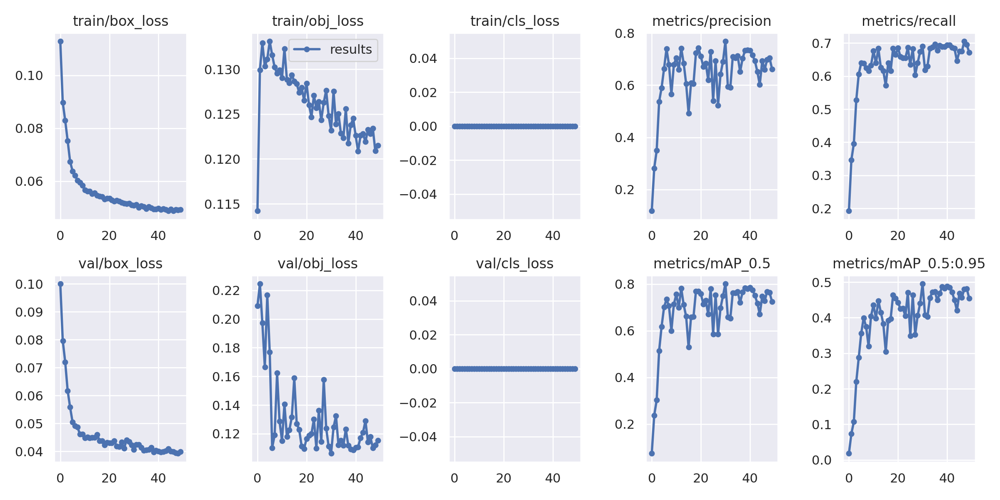

In [11]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/results.png')

Training is good for boxloss but not the object loss. 

Let's Validate with images from the left side: 

In [14]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/weights/best.pt --data moon_left.yaml --img 416  --task test --name Lunar_Model_our_data_Left_side_validation_REAL_USE_THIS 

val: data=/content/drive/MyDrive/yolov5/data/moon_left.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_Model_our_data_Left_side_validation_REAL_USE_THIS, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/moon_ensemble_left/labels/test... 436 images, 0 backgrounds, 0 corrupt: 100% 436/436 [00:13<00:00, 32.64it/s]
test: New cache created: /content/drive/MyDrive/yolov5/datasets/moon_ensemble_left/labels/test.cache
                 Class     Images  Instan

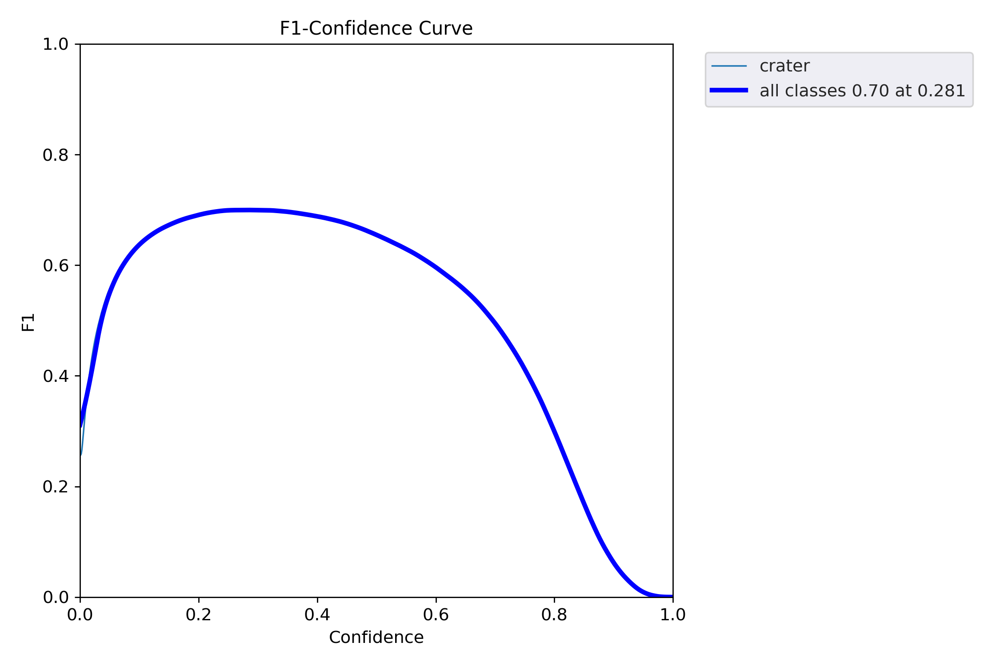

In [8]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_Model_our_data_Left_side_validation_REAL_USE_THIS/F1_curve.png')

We can see that it is performing much better than Gareths data, with a precision of 76% and recall of 65% as well as a high mAP 50 of 76%. Great for now. Plus the F1 curve looks good with a high number and an Okay confidence level of 28%.

Let's test it on the test data from the Right side. We are expecting it to perform worse, as the data will be darker, and we have not used any data augmentation (apart from that originally in YoloV5) which would make the model better to detect darker craters. 

In [19]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/weights/best.pt --data moon_right.yaml --img 416  --task test --name Lunar_Model_our_data_Left_side_validation_REAL_USE_THIS_with_right_data 

val: data=/content/drive/MyDrive/yolov5/data/moon_right.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_Model_our_data_Left_side_validation_REAL_USE_THIS_with_right_data, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/moon_ensemble_right/labels/test.cache... 436 images, 3 backgrounds, 0 corrupt: 100% 436/436 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/14 [00:00<?, ?it/s]tensor([0.

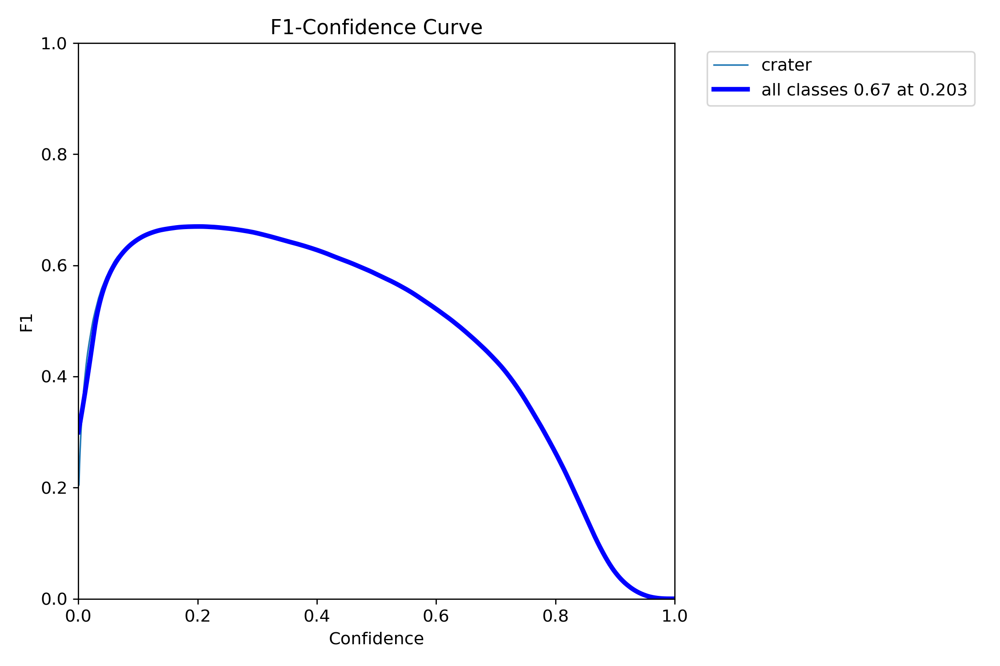

In [9]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_Model_our_data_Left_side_validation_REAL_USE_THIS_with_right_data/F1_curve.png')

As predicted it is less accurate but still decent. We can see this by the F1 threshold being lower, and the precision is lower at 73% and recall at 62% and mAP50 of 72%. Its not lower  by much but still a little. 



## Now we train our other model on data from the right Side (Darker):


- Same hyperparameters and model size. 

In [15]:
!python train.py --img 416 --cfg yolov5m.yaml --hyp /content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50 --batch 128 --epochs 50 --data moon_right.yaml --weights yolov5m.pt --name Lunar_Model_our_data_Right_side --single-cls 

train: weights=yolov5m.pt, cfg=yolov5m.yaml, data=moon_right.yaml, hyp=/content/drive/MyDrive/yolov5/data/hyps/hyp_IoU50, epochs=50, batch_size=128, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=True, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=Lunar_Model_our_data_Right_side, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.3, cls_pw=1.0, obj=0.7, obj_pw=1.0, 

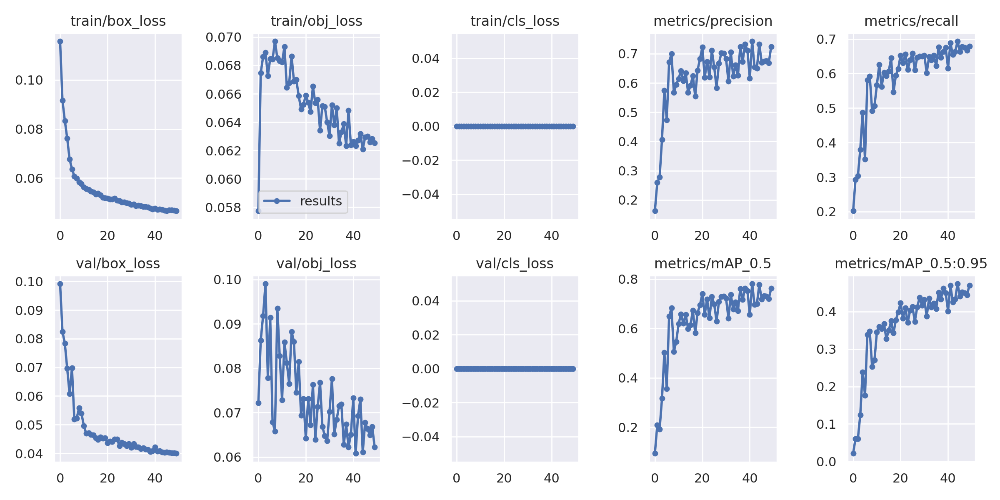

In [10]:
Image(filename='/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/results.png')

The Box loss is converging nicely for the val and train set, but the obj loss is still quite bizarre. The metrics seem to also still be climbing, However I do not think running the model longer wouldve changed much. 

At least the obj loss for validation is going down more or less.

Let's Validate our Model: On the same side as it was trained on: The right side: 

In [16]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt --data moon_right.yaml --img 416  --task test --name Lunar_Model_our_data_Right_side_validation_REAL_USE_THIS 

val: data=/content/drive/MyDrive/yolov5/data/moon_right.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_Model_our_data_Right_side_validation_REAL_USE_THIS, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/moon_ensemble_right/labels/test... 436 images, 3 backgrounds, 0 corrupt: 100% 436/436 [00:13<00:00, 32.85it/s]
test: New cache created: /content/drive/MyDrive/yolov5/datasets/moon_ensemble_right/labels/test.cache
                 Class     Images  I

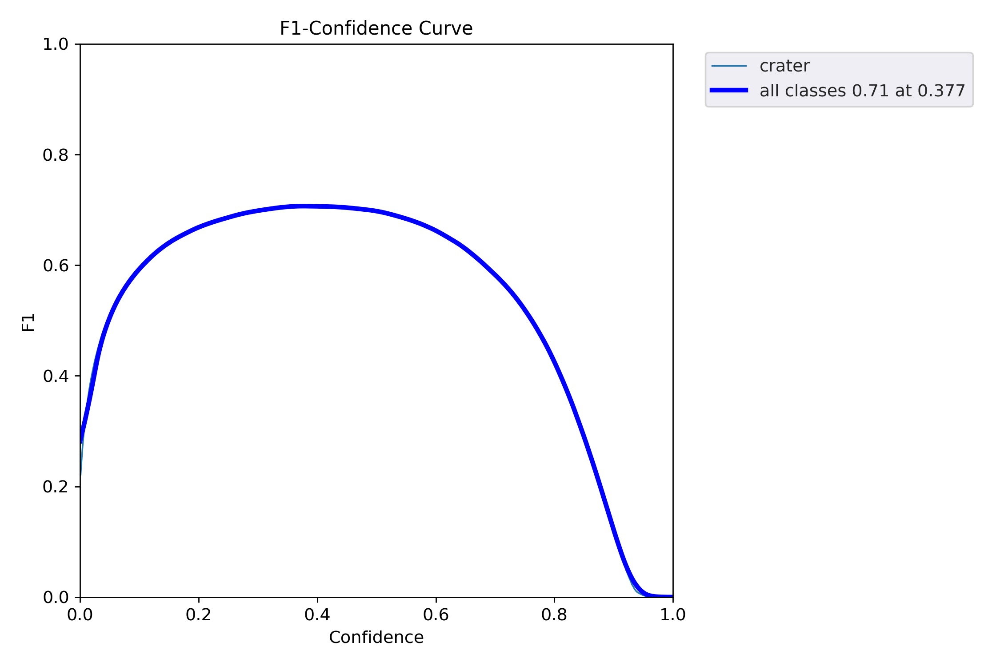

In [11]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_Model_our_data_Right_side_validation_REAL_USE_THIS/F1_curve.png')

The F1 curve looks quite good, it is well shaped, and has a decent threshold at 38%. We have a precision of 74% and recall of 67% and mAP50 of 77%.

Great, let's look at how it performed on the other side of the moon (lighter).

Let's test how it performs on pictures from the left side: 

In [18]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt --data moon_left.yaml --img 416  --task test --name Lunar_Model_our_data_Right_side_validation_REAL_USE_THIS_with_left_data 

val: data=/content/drive/MyDrive/yolov5/data/moon_left.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_Model_our_data_Right_side_validation_REAL_USE_THIS_with_left_data, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
test: Scanning /content/drive/MyDrive/yolov5/datasets/moon_ensemble_left/labels/test.cache... 436 images, 0 backgrounds, 0 corrupt: 100% 436/436 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95:   0% 0/14 [00:00<?, ?it/s]tensor([0.8

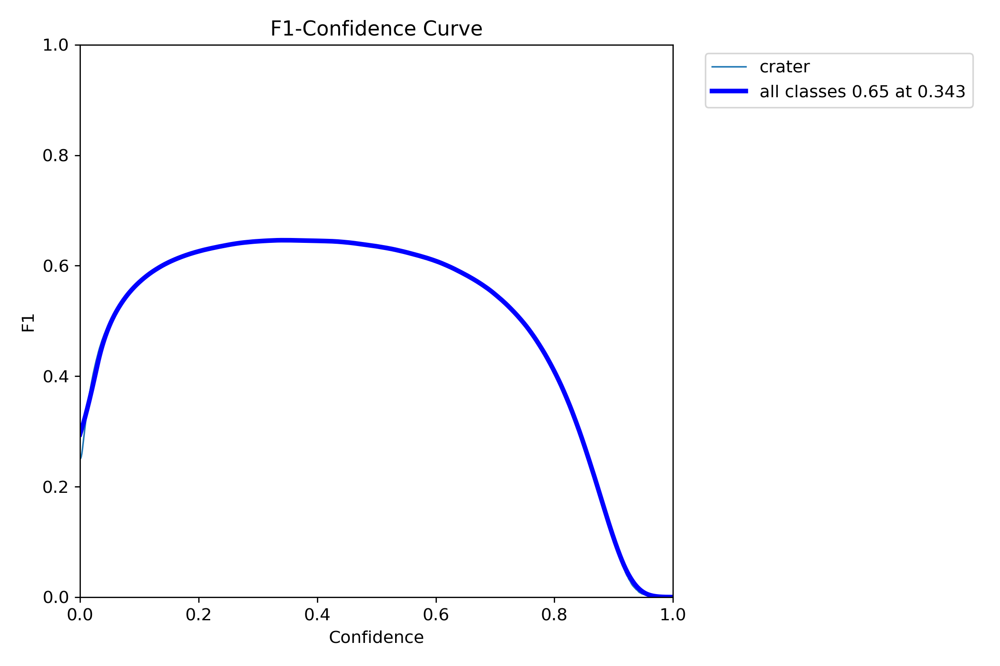

In [12]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_Model_our_data_Right_side_validation_REAL_USE_THIS_with_left_data/F1_curve.png')

From this f1 curve we can see a lower confidence threshold as well as maximum F1 score.  This tells us our model performed less well. But still quite good. 

As predicted the model trained on dark side of the moon performs less well on the brighter side. And the same the other way around.

# Now that we have the models for the left and right hand sides, we can combine together as an ensemble to see if they perform better on left and right side data: 

- First let's ensemble both models on test data from the right side:  

In [21]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt /content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/weights/best.pt --data moon_right.yaml --img 416  --task test --name Lunar_Model_our_data_Ensemble_on_Right_test 

val: data=/content/drive/MyDrive/yolov5/data/moon_right.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt', '/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_Model_our_data_Ensemble_on_Right_test, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
Ensemble created with ['/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt', '/content/drive/M

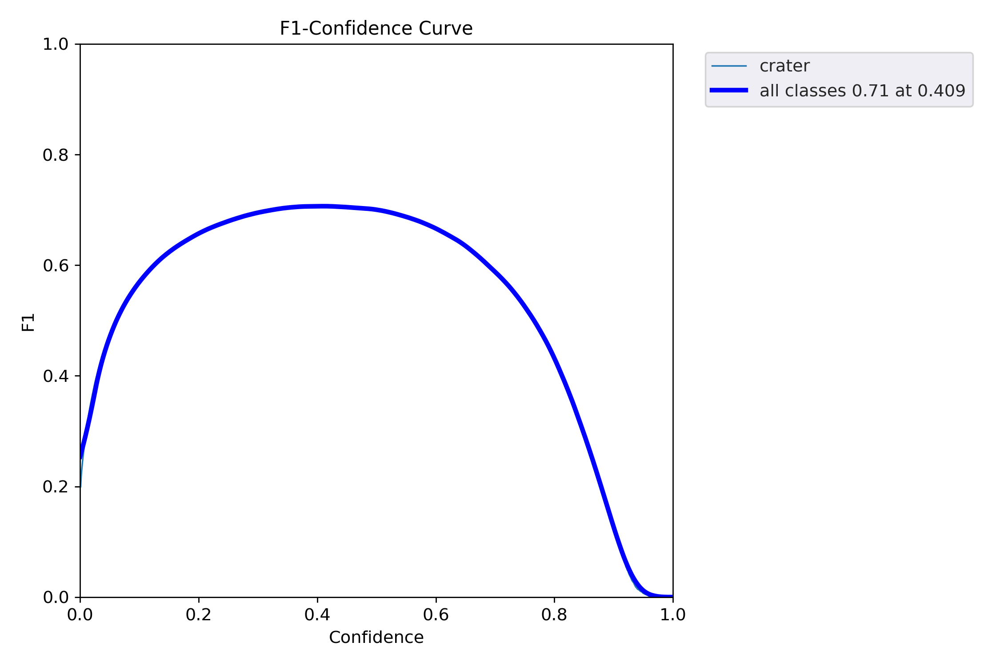

In [13]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_Model_our_data_Ensemble_on_Right_test/F1_curve.png')

Let's now check for the left data: 

In [22]:
!python val.py --weights /content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt /content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/weights/best.pt --data moon_left.yaml --img 416  --task test --name Lunar_Model_our_data_Ensemble_on_Left_test 

val: data=/content/drive/MyDrive/yolov5/data/moon_left.yaml, weights=['/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt', '/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Left_side/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, max_det=300, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=Lunar_Model_our_data_Ensemble_on_Left_test, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-72-g064365d Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (NVIDIA A100-SXM4-40GB, 40536MiB)

Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
Fusing layers... 
YOLOv5m summary: 212 layers, 20852934 parameters, 0 gradients, 47.9 GFLOPs
Ensemble created with ['/content/drive/MyDrive/yolov5/runs/train/Lunar_Model_our_data_Right_side/weights/best.pt', '/content/drive/MyD

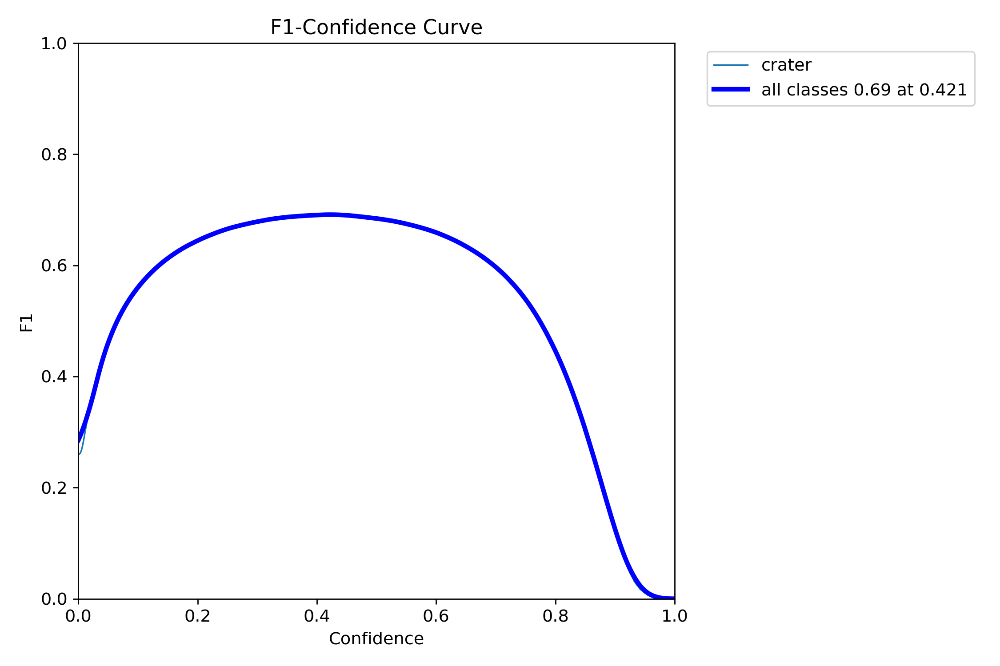

In [14]:
Image(filename='/content/drive/MyDrive/yolov5/runs/val/Lunar_Model_our_data_Ensemble_on_Left_test/F1_curve.png')

From the above plots, we can see that using the ensemble has allowed us to achieve high F1 scores, with decently high threshold values at aruond 40%. 

And because the 2 models have be trained seperatly on different parts of the moon, we think having them as an ensemble will help us make more accurate predictions with the test set on friday.